# Yelp Dataset Analysis

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

## Specify folder paths

In [60]:
data_folder = "data/"
plot_folder = "plots/"

## Load review data

In [61]:
file_to_read = input(f"Please specify which file you would like to read the data from: \n{data_folder}")
df = pd.read_csv(data_folder+file_to_read+".csv", index_col=0)
df.head()

,user_id,business_id,stars,useful,text,date,text_length,nbr_words
4,DMtVkV1K2DPimItj9xUfjw,XZbuPXdyA0ZtTu3AzqtQhg,4,1,Bobby Flay's restaurant at Caesar's Palace. T...,2012-11-06 06:00:13,849,146
6,FUT-tRk_GVBNqwS_Hogolw,lmxA0dJM0XsPCIHPXhEQ-g,2,1,I just want to note that I am all about eating...,2016-06-11 21:17:30,845,168
7,oCFvgGH40QHc25qOUrpu3A,e13SEvJud_vgeDR_doL4sQ,5,1,Absolutely love it!!.The most authentic and in...,2016-09-18 18:37:45,462,74
8,3I806vywudUaWV6yVGHE2w,d4qwVw4PcN-_2mK2o1Ro1g,4,2,I was excited to finally eat here. I ordered C...,2010-01-08 18:26:09,152,30
9,Pvb59pY9rcZM5xo1quPbbA,eaNenRk_liZBERFFLCXqqQ,5,1,The high quality Korean BBQ that started it al...,2018-08-24 00:08:38,312,58


In [62]:
df['date'] = pd.to_datetime(df.date)
df['date_year'] = df.date.dt.year
df['date_year_month'] = df.date.dt.year*100 + df.date.dt.month
#df['nbr_words'] = df.text.apply(lambda x: len(x.split(' ')))
df['text_length_round_100'] = df.text_length.round(decimals=-2)/100
df['text_length_round_100'] = df.text_length_round_100.astype('int')
df['text_length_round_200'] = df.text_length.round(decimals=-2)/200
df['text_length_round_200'] = df.text_length_round_200.astype('int')
df['nbr_words_round_100'] = df.nbr_words.round(decimals=-2)/100
df['nbr_words_round_100'] = df.nbr_words_round_100.astype('int')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 177697 entries, 4 to 484653
Data columns (total 13 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   user_id                177697 non-null  object        
 1   business_id            177697 non-null  object        
 2   stars                  177697 non-null  int64         
 3   useful                 177697 non-null  int64         
 4   text                   177697 non-null  object        
 5   date                   177697 non-null  datetime64[ns]
 6   text_length            177697 non-null  int64         
 7   nbr_words              177697 non-null  int64         
 8   date_year              177697 non-null  int64         
 9   date_year_month        177697 non-null  int64         
 10  text_length_round_100  177697 non-null  int32         
 11  text_length_round_200  177697 non-null  int32         
 12  nbr_words_round_100    177697 non-null  int3

In [63]:
df.head()

,user_id,business_id,stars,useful,text,date,text_length,nbr_words,date_year,date_year_month,text_length_round_100,text_length_round_200,nbr_words_round_100
4,DMtVkV1K2DPimItj9xUfjw,XZbuPXdyA0ZtTu3AzqtQhg,4,1,Bobby Flay's restaurant at Caesar's Palace. T...,2012-11-06 06:00:13,849,146,2012,201211,8,4,1
6,FUT-tRk_GVBNqwS_Hogolw,lmxA0dJM0XsPCIHPXhEQ-g,2,1,I just want to note that I am all about eating...,2016-06-11 21:17:30,845,168,2016,201606,8,4,2
7,oCFvgGH40QHc25qOUrpu3A,e13SEvJud_vgeDR_doL4sQ,5,1,Absolutely love it!!.The most authentic and in...,2016-09-18 18:37:45,462,74,2016,201609,5,2,1
8,3I806vywudUaWV6yVGHE2w,d4qwVw4PcN-_2mK2o1Ro1g,4,2,I was excited to finally eat here. I ordered C...,2010-01-08 18:26:09,152,30,2010,201001,2,1,0
9,Pvb59pY9rcZM5xo1quPbbA,eaNenRk_liZBERFFLCXqqQ,5,1,The high quality Korean BBQ that started it al...,2018-08-24 00:08:38,312,58,2018,201808,3,1,1


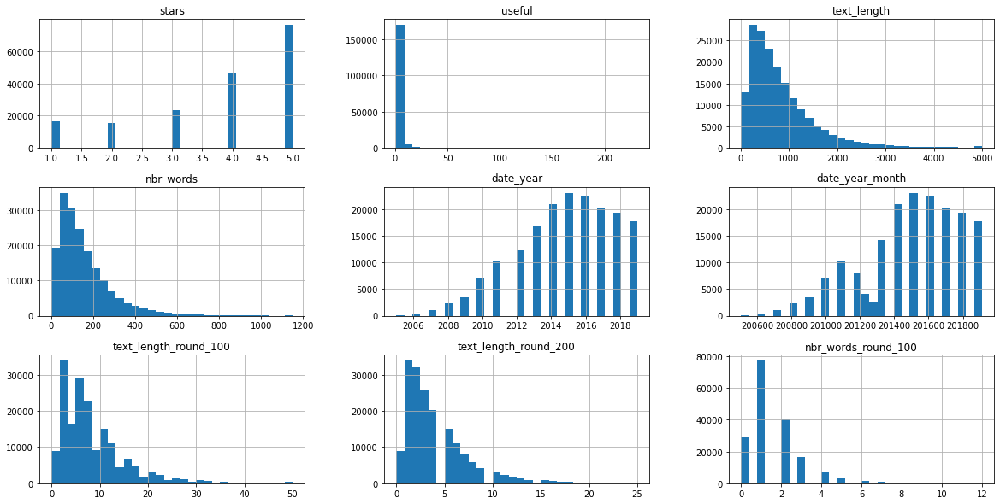

In [64]:
df.hist(figsize=(20,10), bins=30)
plt.savefig(f"{plot_folder}{file_to_read}/all_hist.pdf") 
plt.show()

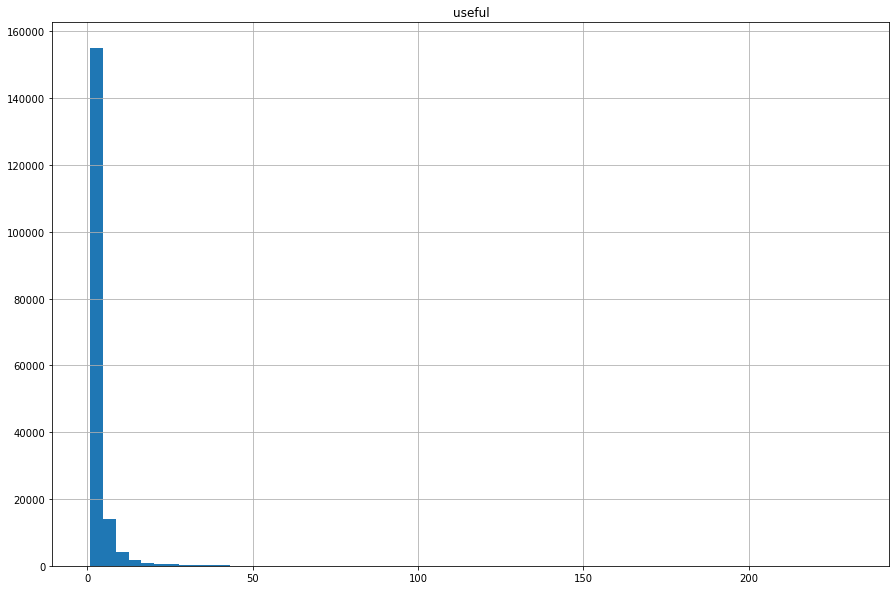

In [65]:
df.hist(column='useful', bins=60, figsize=(15,10))
plt.savefig(f"{plot_folder}{file_to_read}/useful_hist.pdf") 
plt.show()

In [69]:
def boxplot_and_save(df, by, column):
    df.boxplot(by=by, column=column, figsize=(20,10))
    plt.savefig(f"{plot_folder}{file_to_read}/{by}_{column}_boxplot.pdf") 
    plt.show()

def boxplot_and_save_ylim(df, by, column, ylim):
    df.boxplot(by=by, column=column, figsize=(20,10))
    axes = plt.gca()
    axes.set_ylim([0,ylim])
    plt.savefig(f"{plot_folder}{file_to_read}/{by}_{column}_boxplot_ylim_{ylim}.pdf") 
    plt.show()

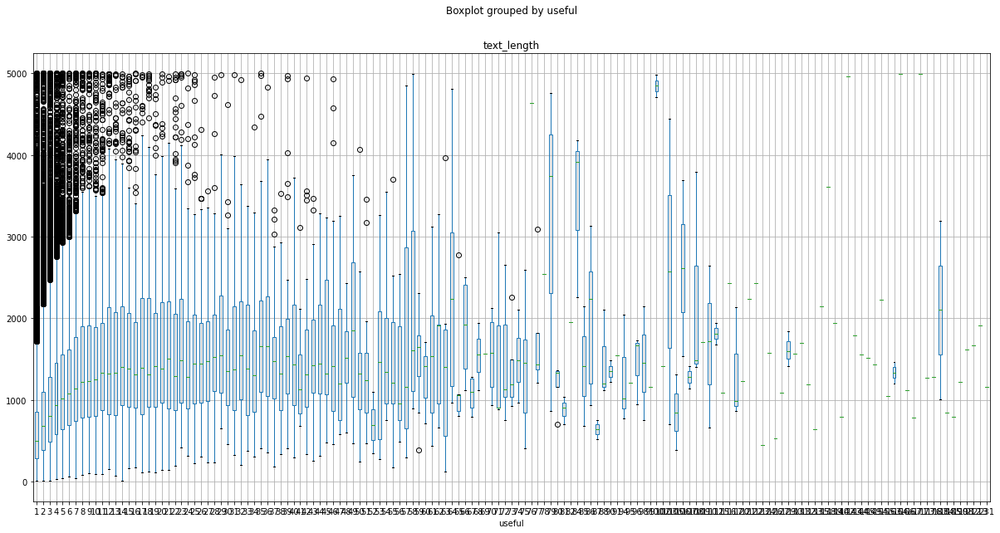

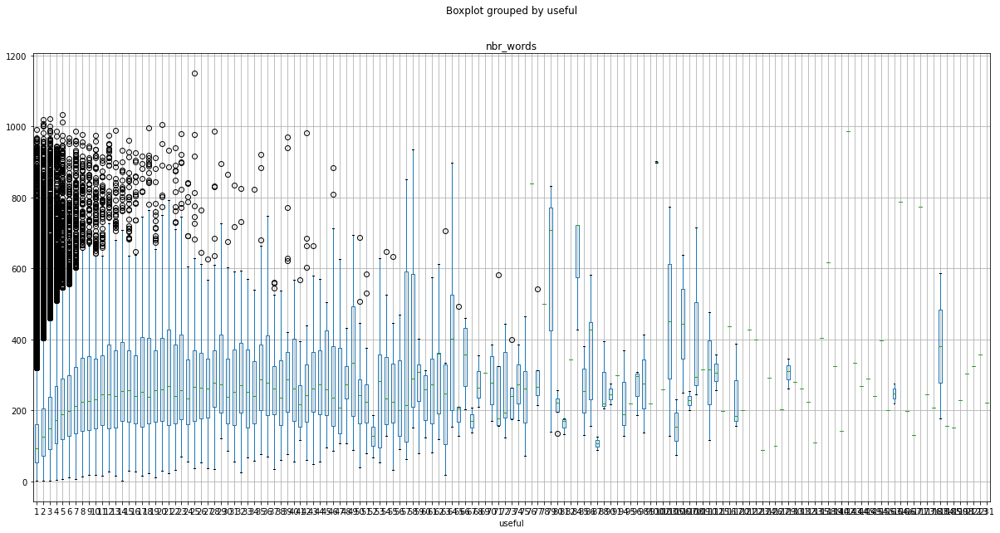

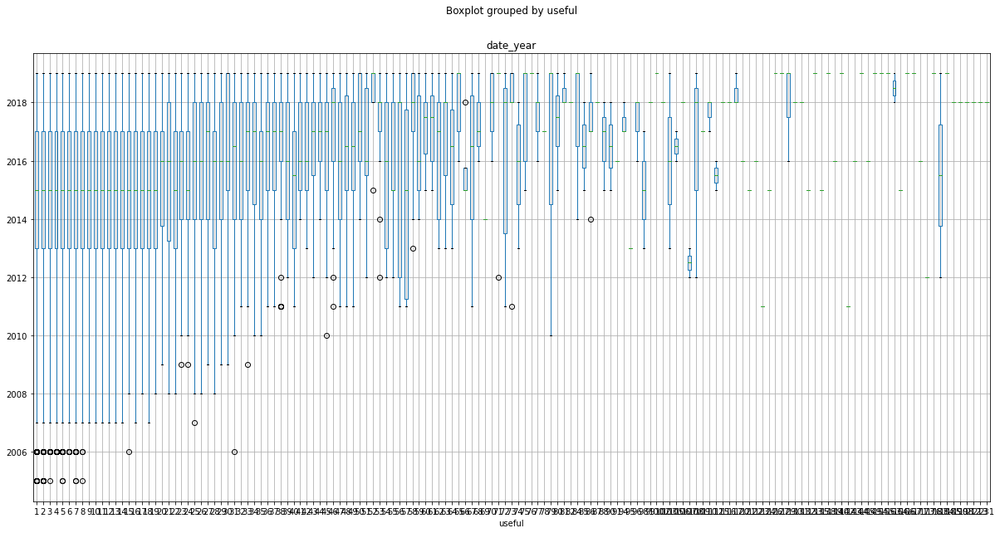

In [67]:
#boxplot_and_save(df, by='useful', column='text_length')
#boxplot_and_save(df, by='useful', column='nbr_words')
#boxplot_and_save(df, by='useful', column='date_year')

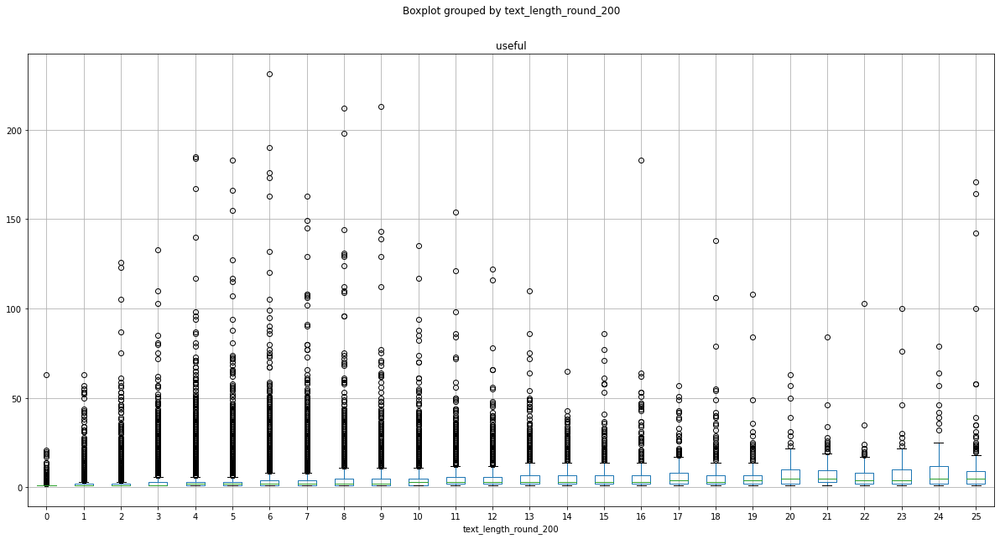

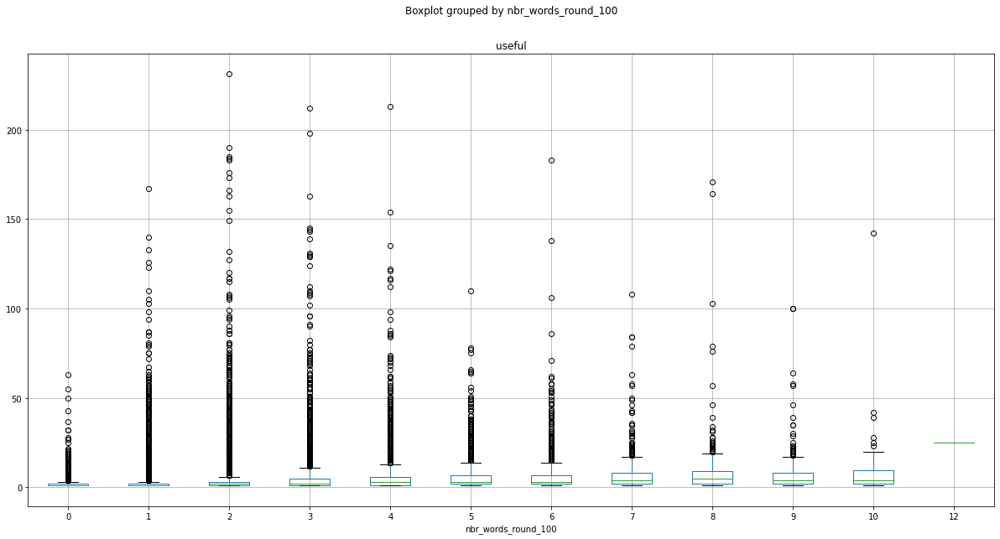

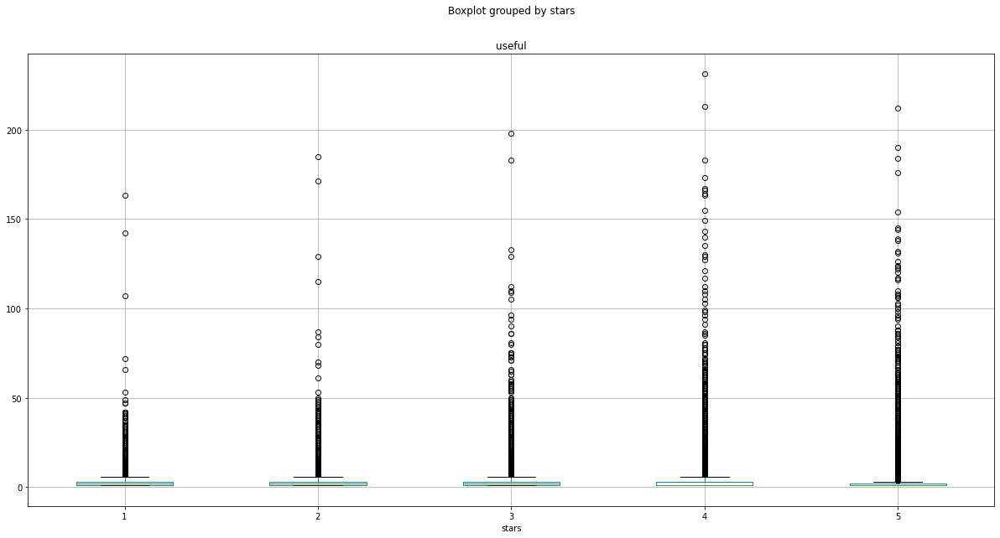

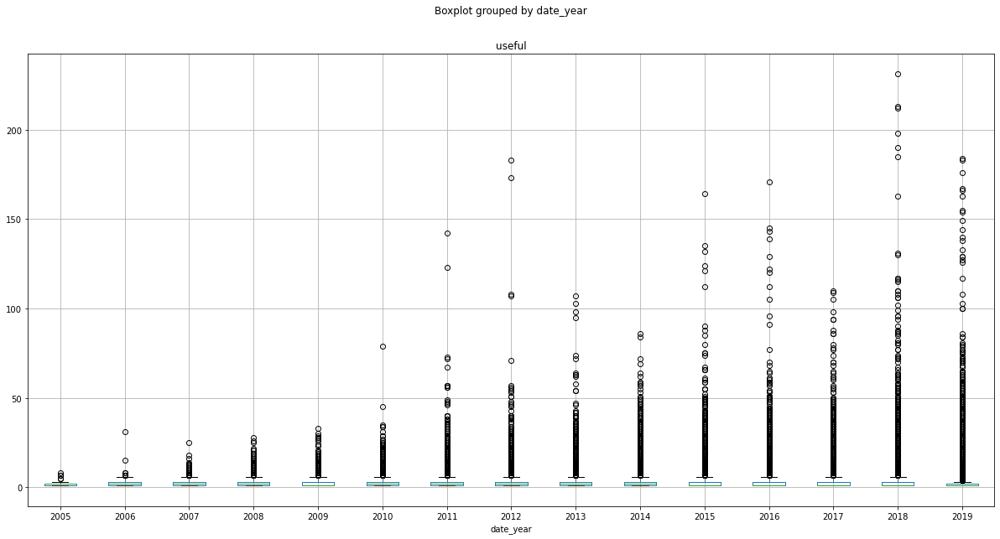

In [68]:
boxplot_and_save(df, by='text_length_round_200', column='useful')
boxplot_and_save(df, by='nbr_words_round_100', column='useful')
boxplot_and_save(df, by='stars', column='useful')
boxplot_and_save(df, by='date_year', column='useful')

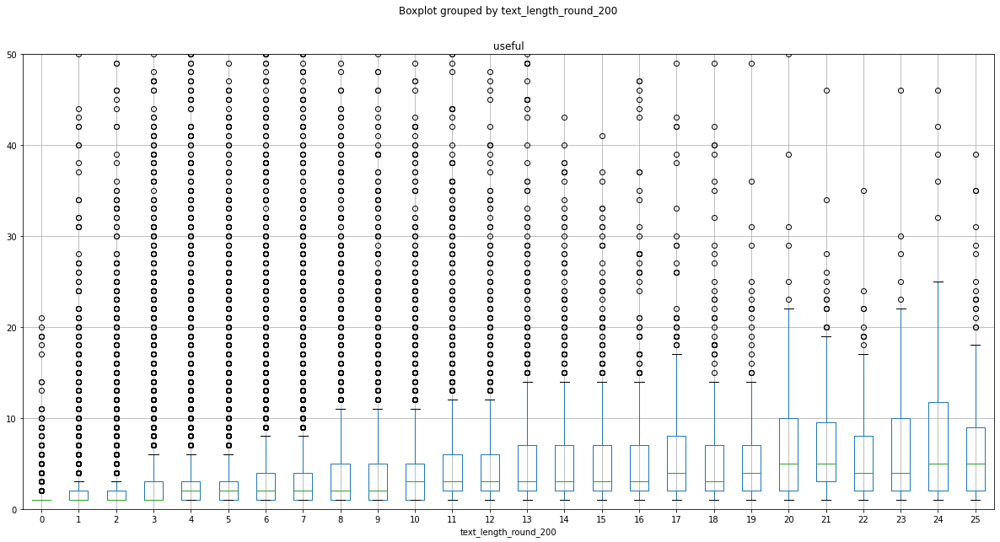

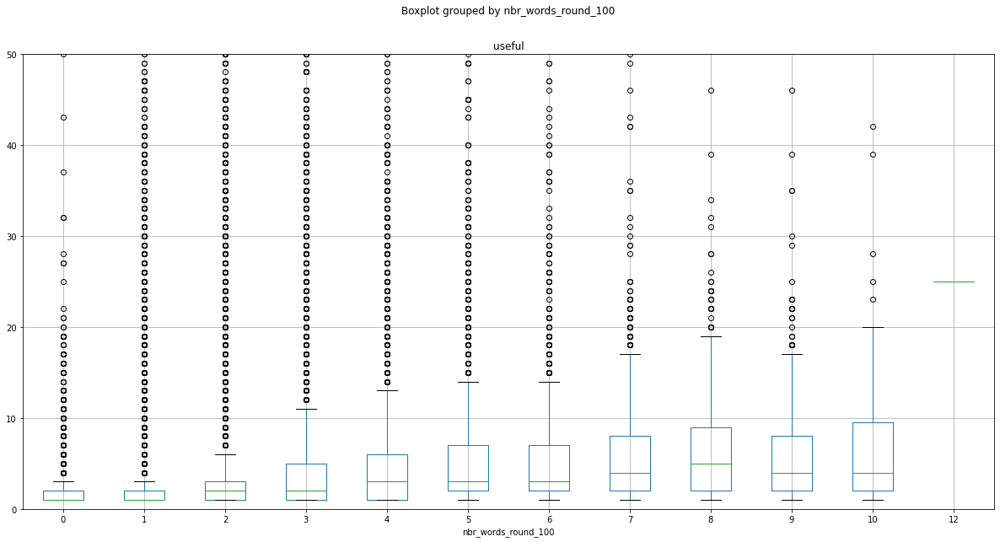

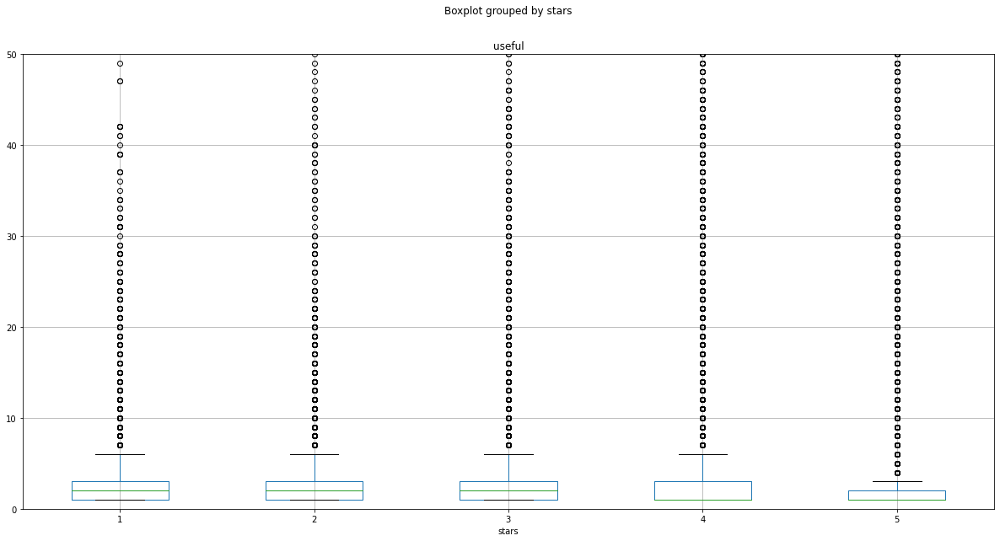

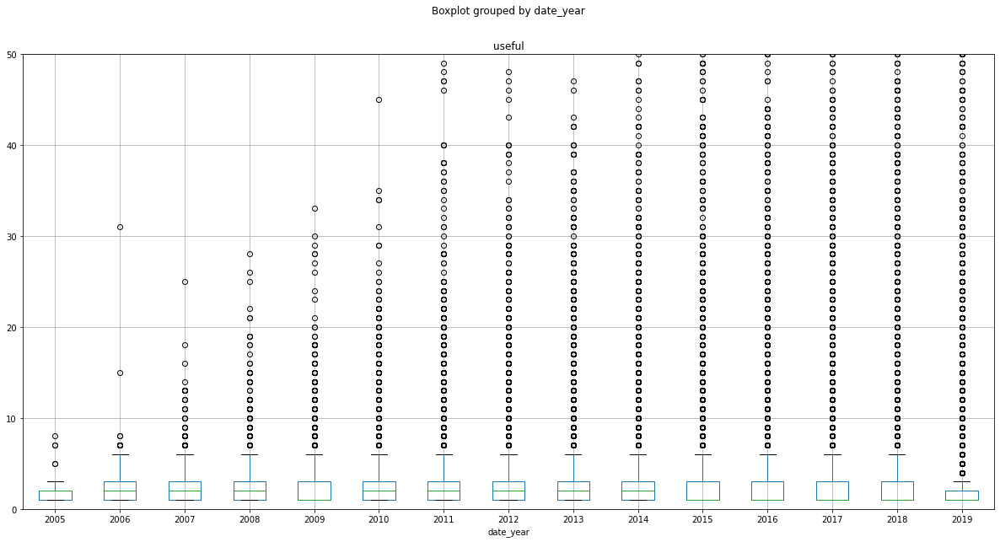

In [71]:
boxplot_and_save_ylim(df, by='text_length_round_200', column='useful', ylim=50)
boxplot_and_save_ylim(df, by='nbr_words_round_100', column='useful', ylim=50)
boxplot_and_save_ylim(df, by='stars', column='useful', ylim=50)
boxplot_and_save_ylim(df, by='date_year', column='useful', ylim=50)